In [1]:
%matplotlib inline

import warnings
import os

import pandas as pd
import numpy as np

from ipyleaflet import Map, Marker, GeoJSON, Circle
from sklearn.linear_model import  LinearRegression
from matplotlib.colors import LogNorm, rgb2hex
from numpy.linalg.linalg import LinAlgError
from scipy.stats import binned_statistic_2d
from geojson import Polygon, Feature, Point
from xgboost import XGBRegressor
from matplotlib.cm import hot_r
from itertools import product
from datetime import datetime
from pylab import rcParams
from scipy import stats
from tqdm import tqdm 

from matplotlib import pyplot as plt
from statsmodels import api as sm


rcParams['figure.figsize'] = 15, 8
warnings.filterwarnings('ignore')
PATH_TO_DATA = 'data'

C:\Users\Public\PythonProjects\Anaconda3\lib\site-packages\statsmodels\compat\pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


In [6]:
data = pd.read_csv(os.path.join(PATH_TO_DATA, 'yellow_tripdata_2016-05.csv'), parse_dates=['tpep_pickup_datetime', 'tpep_dropoff_datetime'])
regions = pd.read_csv(os.path.join(PATH_TO_DATA, 'regions.csv'), index_col=0, delimiter=';')

print(data.shape)
data.head()

(11836853, 19)


,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RatecodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,1,2016-05-01,2016-05-01 00:17:31,1,3.60,-73.985901,40.768040,1,N,-73.983986,40.730099,1,15.0,0.5,0.5,1.50,0.0,0.3,17.80
1,2,2016-05-01,2016-05-01 00:07:31,1,1.68,-73.991577,40.744751,1,N,-73.975700,40.765469,1,7.5,0.5,0.5,0.88,0.0,0.3,9.68
2,2,2016-05-01,2016-05-01 00:07:01,6,1.09,-73.993073,40.741573,1,N,-73.980995,40.744633,1,6.5,0.5,0.5,1.56,0.0,0.3,9.36
3,2,2016-05-01,2016-05-01 00:19:47,1,4.21,-73.991943,40.684601,1,N,-74.002258,40.733002,1,17.0,0.5,0.5,3.66,0.0,0.3,21.96
4,2,2016-05-01,2016-05-01 00:06:39,1,0.56,-74.005280,40.740192,1,N,-73.997498,40.737564,1,6.0,0.5,0.5,1.46,0.0,0.3,8.76


In [7]:
# bottom x left     and    top x right
longitude_bottom = -74.25559
longitude_top = -73.70001

latitude_left = 40.49612
latitude_right = 40.91553

def clean_data(df):
    query = 'passenger_count != 0 & trip_distance != 0 & tpep_pickup_datetime != tpep_dropoff_datetime & '+ \
    ' pickup_longitude > {} & pickup_longitude < {} & pickup_latitude > {} & pickup_latitude < {} '\
    .format(longitude_bottom, longitude_top, latitude_left, latitude_right)
    
    df = df.query(query)
    df['tpep_pickup_datetime'] = df['tpep_pickup_datetime'].apply(lambda x: x.replace(minute=0, second=0))
    
    return df

In [8]:
%%time
data = clean_data(data)

print(data.shape)

(11626521, 19)
Wall time: 1min 39s


In [9]:
%%time
binx=np.sort(regions.west.unique())[1:]
biny=np.sort(regions.south.unique())[1:]

x = data.pickup_longitude.values
y = data.pickup_latitude.values

_, _, _, regions_ids = binned_statistic_2d(x, y, regions, 'count', bins=[binx, biny])

regions_ids = regions_ids + 1

Wall time: 7.94 s


In [10]:
data['region'] = regions_ids

In [11]:
%%time
all_times = data['tpep_pickup_datetime'].view('int64')

binx = regions.index.values.tolist() + [2501]
biny = np.sort(all_times.unique()).tolist() + [np.datetime64('2016-06-01T00:00:00.000000000').view('int64')]

x = data.region.values
y = all_times

matrix, _, _, _ = binned_statistic_2d(x, y, None, 'count', bins=[binx, biny])

Wall time: 3.99 s


In [12]:
aggregated_df = pd.DataFrame(matrix, index=regions.index.values, columns= np.sort(data['tpep_pickup_datetime'].unique()))

In [13]:
latitude = 40.748817
longitude = -73.985428
query = 'west < {} & east > {} & south < {} & north > {}'.format(longitude, longitude, latitude, latitude)
region = regions.query(query).index.values[0]

print(region)

1231


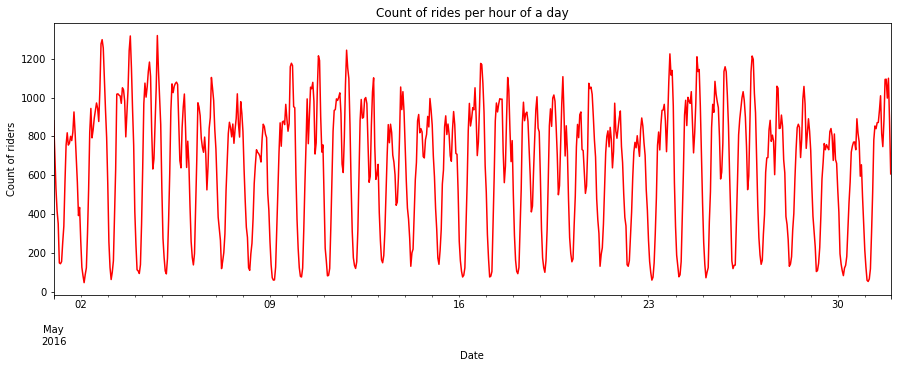

In [14]:
_ = plt.figure(figsize = (15,5))

aggregated_df.loc[region].plot(kind="line",color="r")
plt.title('Count of rides per hour of a day')
plt.xlabel('Date')
_ = plt.ylabel('Count of riders')

In [15]:
all_cells = aggregated_df.shape[0] * aggregated_df.shape[1]
empty_cells = matrix[matrix == 0].shape[0]
filled_cells = all_cells - empty_cells
pers = filled_cells / all_cells * 100

'All: {}, empty: {}, with rides: {}. Fill percentage: {}'.format(all_cells, empty_cells, filled_cells, pers)

'All: 1860000, empty: 1718238, with rides: 141762. Fill percentage: 7.621612903225807'

In [16]:
data = aggregated_df
del aggregated_df

In [17]:
sums = data.sum(axis=1)
sums = sums[sums == 0]
sums.shape

(1283,)

In [53]:
m = Map(center=[40.748817, -73.985428], zoom=10)

mark = Marker(location=[40.748817, -73.985428])
mark.visible
m += mark

m

Map(center=[40.748817, -73.985428], layers=(TileLayer(options=['attribution', 'detect_retina', 'max_zoom', 'min_zoom', 'opacity', 'tile_size']), Marker(location=[40.748817, -73.985428], options=['alt', 'clickable', 'draggable', 'keyboard', 'opacity', 'rise_offset', 'rise_on_hover', 'title', 'z_index_offset'])), layout=Layout(align_self='stretch', height='400px'), options=['attribution_control', 'bounce_at_zoom_limits', 'box_zoom', 'center', 'close_popup_on_click', 'double_click_zoom', 'dragging', 'inertia', 'inertia_deceleration', 'inertia_max_speed', 'keyboard', 'keyboard_pan_offset', 'keyboard_zoom_offset', 'max_zoom', 'min_zoom', 'scroll_wheel_zoom', 'tap', 'tap_tolerance', 'touch_zoom', 'world_copy_jump', 'zoom', 'zoom_animation_threshold', 'zoom_control', 'zoom_start'], zoom=10)

In [19]:
def create_rectangle(row, color, opacity):
    x1, x2, y1, *y2 = row
    coordinates = [[[x1, y1],[x1, y2],[x2, y2],[x2, y1]]]
    poly = Polygon(coordinates)
    prop = {"style":{"color":'black', "fillColor":color, "fillOpacity":opacity, "opacity":0.5, "weight":1}}
    feature = Feature(geometry=poly, properties=prop)
    return feature

In [20]:
def get_heat_map(keys):
    colors =[rgb2hex(d[0:3]) for d in hot_r(LogNorm(vmin=1, vmax=1000000)(keys.unique()))]
    color_dict = {k: v for k, v in zip(keys.unique(), colors)}
    
    m = Map(center=[40.708817, -73.985428], zoom=10)
    
    for region in tqdm(range(1, 2501)):
        row = regions.loc[[region]].values[0]
        
        if region in keys.index:
            color = color_dict[keys[region]]
            opacity = 0.0 if keys[region] == 0 else 0.5
        else:
            color = '#FFFFFF'
            opacity = 0.0
            
        feature = create_rectangle(row, color, opacity)
        m += GeoJSON(data=feature)
        
    return m
    

In [52]:
get_heat_map(data.sum(axis=1))

100%|███████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [01:35<00:00, 14.13it/s]


Map(center=[40.708817, -73.985428], layers=(TileLayer(options=['attribution', 'detect_retina', 'max_zoom', 'min_zoom', 'opacity', 'tile_size']), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.49612], [-74.25559, [40.504508200000004]], [-74.2444784, [40.504508200000004]], [-74.2444784, 40.49612]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#000000", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.504508200000004], [-74.25559, [40.512896399999995]], [-74.2444784, [40.512896399999995]], [-74.2444784, 40.504508200000004]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#000000", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.512896399999995], [-74.25559, [40.5212846]], [-74.2444784, [40.5212846]], [-74.2444784, 40.512896399999995]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#000000", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.5212846], [-74.25559, [40.52967279999999]], [-74.2444784, [40.52967279999999]], [-74.2444784, 40.5212846]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#000000", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.52967279999999], [-74.25559, [40.538061]], [-74.2444784, [40.538061]], [-74.2444784, 40.52967279999999]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#000000", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.538061], [-74.25559, [40.546449200000005]], [-74.2444784, [40.546449200000005]], [-74.2444784, 40.538061]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#000000", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.546449200000005], [-74.25559, [40.554837400000004]], [-74.2444784, [40.554837400000004]], [-74.2444784, 40.546449200000005]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#000000", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.554837400000004], [-74.25559, [40.5632256]], [-74.2444784, [40.5632256]], [-74.2444784, 40.554837400000004]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#000000", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.5632256], [-74.25559, [40.571613799999994]], [-74.2444784, [40.571613799999994]], [-74.2444784, 40.5632256]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#000000", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.571613799999994], [-74.25559, [40.580002]], [-74.2444784, [40.580002]], [-74.2444784, 40.571613799999994]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#000000", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.580002], [-74.25559, [40.5883902]], [-74.2444784, [40.5883902]], [-74.2444784, 40.580002]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#000000", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.5883902], [-74.25559, [40.5967784]], [-74.2444784, [40.5967784]], [-74.2444784, 40.5883902]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#0000

In [22]:
m3 = Map(center=[40.708817, -73.985428], zoom=10)
m3 += Circle(location=[40.689249, -74.044500])
m3

Map(center=[40.708817, -73.985428], layers=(TileLayer(options=['attribution', 'detect_retina', 'max_zoom', 'min_zoom', 'opacity', 'tile_size']), Circle(location=[40.689249, -74.0445], options=['class_name', 'clickable', 'color', 'dash_array', 'fill', 'fill_color', 'fill_opacity', 'line_cap', 'line_join', 'opacity', 'pointer_events', 'stroke', 'weight'])), layout=Layout(align_self='stretch', height='400px'), options=['attribution_control', 'bounce_at_zoom_limits', 'box_zoom', 'center', 'close_popup_on_click', 'double_click_zoom', 'dragging', 'inertia', 'inertia_deceleration', 'inertia_max_speed', 'keyboard', 'keyboard_pan_offset', 'keyboard_zoom_offset', 'max_zoom', 'min_zoom', 'scroll_wheel_zoom', 'tap', 'tap_tolerance', 'touch_zoom', 'world_copy_jump', 'zoom', 'zoom_animation_threshold', 'zoom_control', 'zoom_start'], zoom=10)

In [23]:
get_heat_map(data.mean(axis=1))

100%|███████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [01:47<00:00,  8.56it/s]


Map(center=[40.708817, -73.985428], layers=(TileLayer(options=['attribution', 'detect_retina', 'max_zoom', 'min_zoom', 'opacity', 'tile_size']), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.49612], [-74.25559, [40.504508200000004]], [-74.2444784, [40.504508200000004]], [-74.2444784, 40.49612]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#000000", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.504508200000004], [-74.25559, [40.512896399999995]], [-74.2444784, [40.512896399999995]], [-74.2444784, 40.504508200000004]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#000000", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.512896399999995], [-74.25559, [40.5212846]], [-74.2444784, [40.5212846]], [-74.2444784, 40.512896399999995]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#000000", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.5212846], [-74.25559, [40.52967279999999]], [-74.2444784, [40.52967279999999]], [-74.2444784, 40.5212846]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#000000", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.52967279999999], [-74.25559, [40.538061]], [-74.2444784, [40.538061]], [-74.2444784, 40.52967279999999]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#000000", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.538061], [-74.25559, [40.546449200000005]], [-74.2444784, [40.546449200000005]], [-74.2444784, 40.538061]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#000000", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.546449200000005], [-74.25559, [40.554837400000004]], [-74.2444784, [40.554837400000004]], [-74.2444784, 40.546449200000005]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#000000", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.554837400000004], [-74.25559, [40.5632256]], [-74.2444784, [40.5632256]], [-74.2444784, 40.554837400000004]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#000000", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.5632256], [-74.25559, [40.571613799999994]], [-74.2444784, [40.571613799999994]], [-74.2444784, 40.5632256]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#000000", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.571613799999994], [-74.25559, [40.580002]], [-74.2444784, [40.580002]], [-74.2444784, 40.571613799999994]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#000000", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.580002], [-74.25559, [40.5883902]], [-74.2444784, [40.5883902]], [-74.2444784, 40.580002]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#000000", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.5883902], [-74.25559, [40.5967784]], [-74.2444784, [40.5967784]], [-74.2444784, 40.5883902]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#0000

In [24]:
means = data.mean(axis=1)
means = means[means >= 5]
print(means.shape)
get_heat_map(means)

(102,)


100%|███████████████████████████████████████████████████████████████████████████████████████████████| 2500/2500 [01:45<00:00, 13.24it/s]


Map(center=[40.708817, -73.985428], layers=(TileLayer(options=['attribution', 'detect_retina', 'max_zoom', 'min_zoom', 'opacity', 'tile_size']), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.49612], [-74.25559, [40.504508200000004]], [-74.2444784, [40.504508200000004]], [-74.2444784, 40.49612]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#FFFFFF", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.504508200000004], [-74.25559, [40.512896399999995]], [-74.2444784, [40.512896399999995]], [-74.2444784, 40.504508200000004]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#FFFFFF", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.512896399999995], [-74.25559, [40.5212846]], [-74.2444784, [40.5212846]], [-74.2444784, 40.512896399999995]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#FFFFFF", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.5212846], [-74.25559, [40.52967279999999]], [-74.2444784, [40.52967279999999]], [-74.2444784, 40.5212846]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#FFFFFF", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.52967279999999], [-74.25559, [40.538061]], [-74.2444784, [40.538061]], [-74.2444784, 40.52967279999999]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#FFFFFF", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.538061], [-74.25559, [40.546449200000005]], [-74.2444784, [40.546449200000005]], [-74.2444784, 40.538061]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#FFFFFF", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.546449200000005], [-74.25559, [40.554837400000004]], [-74.2444784, [40.554837400000004]], [-74.2444784, 40.546449200000005]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#FFFFFF", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.554837400000004], [-74.25559, [40.5632256]], [-74.2444784, [40.5632256]], [-74.2444784, 40.554837400000004]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#FFFFFF", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.5632256], [-74.25559, [40.571613799999994]], [-74.2444784, [40.571613799999994]], [-74.2444784, 40.5632256]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#FFFFFF", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.571613799999994], [-74.25559, [40.580002]], [-74.2444784, [40.580002]], [-74.2444784, 40.571613799999994]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#FFFFFF", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.580002], [-74.25559, [40.5883902]], [-74.2444784, [40.5883902]], [-74.2444784, 40.580002]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#FFFFFF", "fillOpacity": 0.0, "opacity": 0.5, "weight": 1}}, "type": "Feature"}), GeoJSON(data={"geometry": {"coordinates": [[[-74.25559, 40.5883902], [-74.25559, [40.5967784]], [-74.2444784, [40.5967784]], [-74.2444784, 40.5883902]]], "type": "Polygon"}, "properties": {"style": {"color": "black", "fillColor": "#FFFF

In [26]:
train_df = pd.read_csv(os.path.join(PATH_TO_DATA, 'train_1282.csv'), index_col=0, parse_dates=[0])

print(train_df.shape)
train_df.head()

(4392, 1)


,1282
2016-01-01 00:00:00,1076.0
2016-01-01 01:00:00,1178.0
2016-01-01 02:00:00,1053.0
2016-01-01 03:00:00,610.0
2016-01-01 04:00:00,401.0


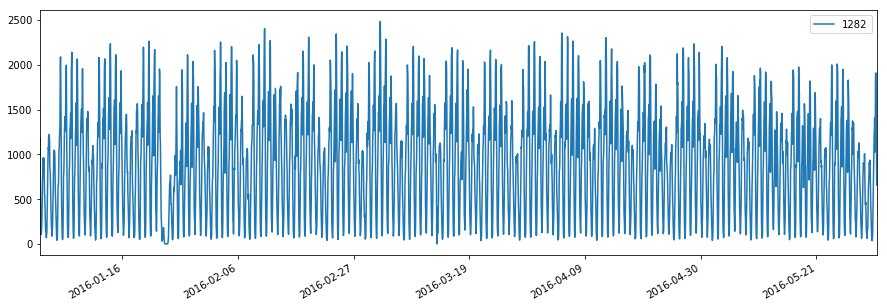

In [27]:
_ = train_df.plot(figsize=(15,5))

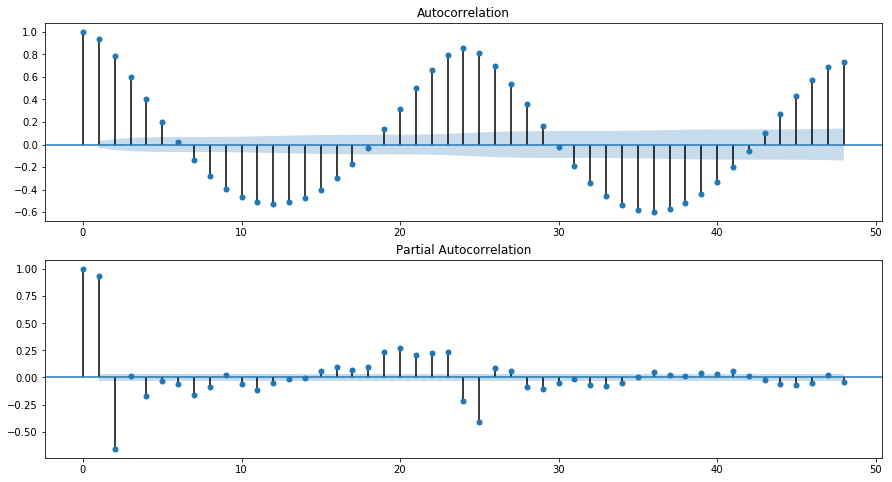

In [28]:
_, ax = plt.subplots(2, 1, figsize=(15, 8))
sm.graphics.tsa.plot_acf(train_df['1282'].values.squeeze(), lags=48, ax=ax[0])
sm.graphics.tsa.plot_pacf(train_df['1282'].values.squeeze(), lags=48, ax=ax[1])
plt.show()

In [29]:
print("Критерий Дики-Фуллера: p=%f" % sm.tsa.stattools.adfuller(train_df['1282'])[1])

Критерий Дики-Фуллера: p=0.000000


In [30]:
hours_in_day = 24

sin_day = np.sin(np.array(range(1, hours_in_day + 1)) * 2 * np.pi / (hours_in_day))
sin_day = np.tile(sin_day, int(train_df.shape[0] / len(sin_day) + 1))

hours_in_week = 7 * 24
sin_week = np.sin(np.array(range(1, hours_in_week + 1)) * 2 * np.pi / (hours_in_week))
sin_week = np.tile(sin_week, int(train_df.shape[0] / len(sin_week) + 2))

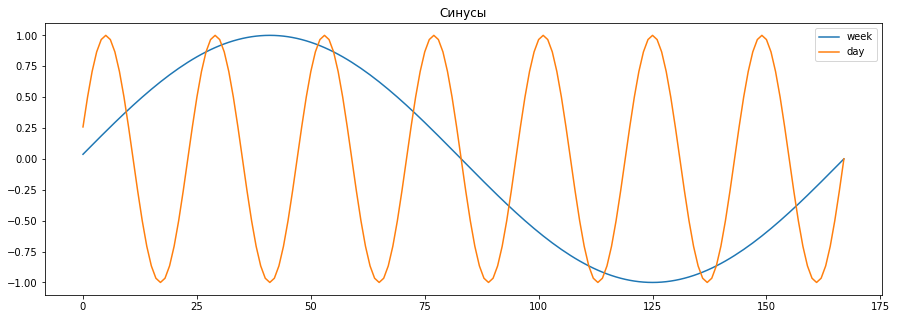

In [31]:
fig = plt.figure(figsize=(15,5))
plt.plot(sin_week[:hours_in_week], label = 'week')
plt.plot(sin_day[:hours_in_week], label = 'day')
plt.title('Синусы')
_ = plt.legend()

In [32]:
days = {'sin_day_%d' % i: sin_day[i: train_df.shape[0] + i] for i in range(hours_in_day)}
weeks = {'sin_week_%d' % i: sin_week[i: train_df.shape[0] + i] for i in range(hours_in_week)}
values = {**days, **weeks}

sin_df = pd.DataFrame(values)

In [33]:
y = train_df['1282'].values
X = sin_df.values

y.shape, X.shape

((4392,), (4392, 192))

In [34]:
model = LinearRegression().fit(X, y)
y_pred =  model.predict(X)
residuals = y - y_pred

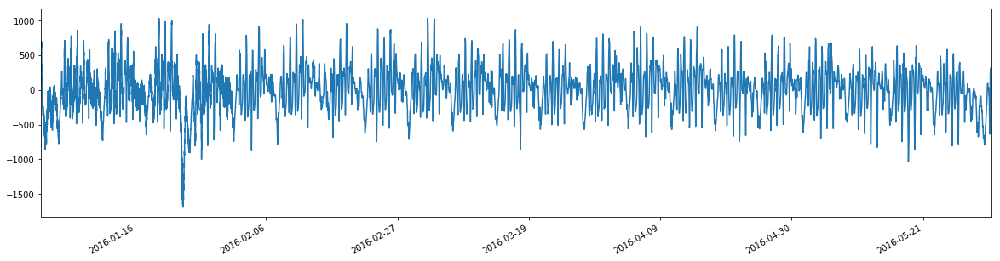

In [35]:
train_df['residuals'] = residuals
_ = train_df['residuals'].plot(figsize=(20,5))

Критерий Дики-Фуллера: p=0.000000


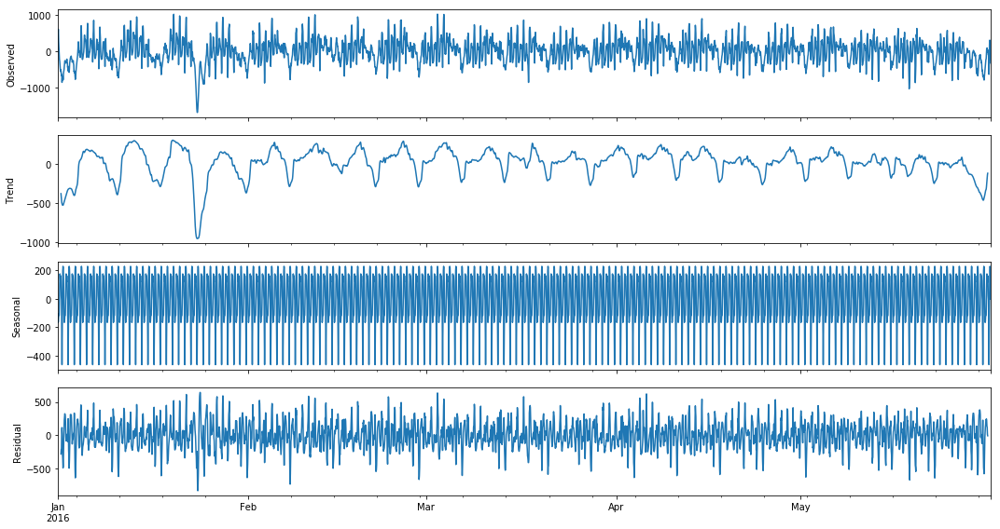

In [36]:
plt.figure(figsize=(15,10))
sm.tsa.seasonal_decompose(train_df.residuals.asfreq('H')).plot()
print("Критерий Дики-Фуллера: p=%f" % sm.tsa.stattools.adfuller(train_df.residuals)[1])

Критерий Дики-Фуллера: p=0.000000


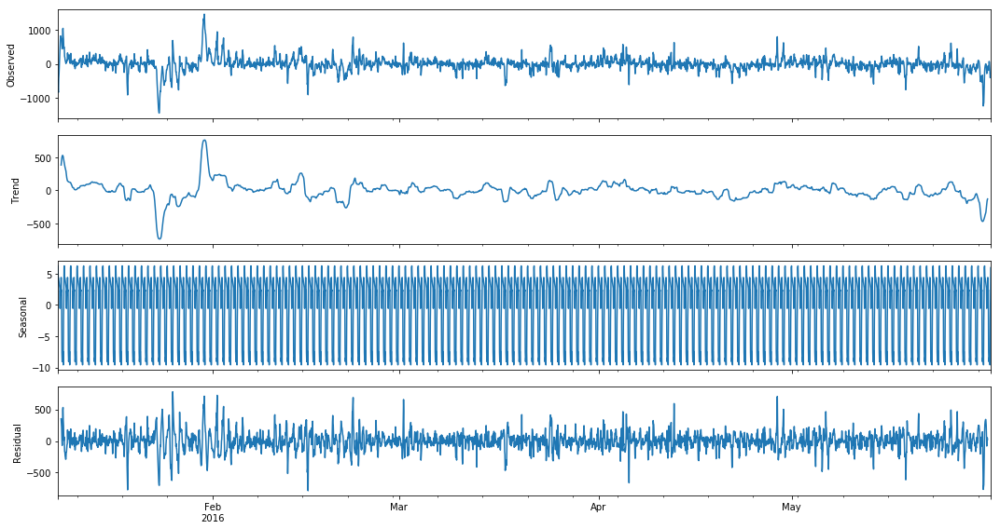

In [37]:
train_df['dif'] = train_df.residuals - train_df.residuals.shift(hours_in_week)
sm.tsa.seasonal_decompose(train_df.dif[hours_in_week:].asfreq('H')).plot()
print("Критерий Дики-Фуллера: p=%f" % sm.tsa.stattools.adfuller(train_df.dif[hours_in_week:])[1])

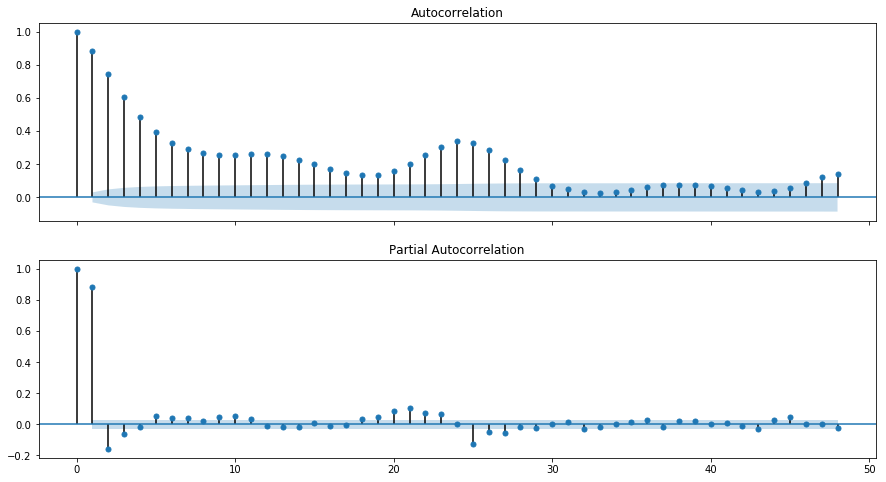

In [38]:
_, ax = plt.subplots(2, 1, sharex=True)
sm.graphics.tsa.plot_acf(train_df.dif[hours_in_week:].values.squeeze(), lags=48, ax=ax[0])
sm.graphics.tsa.plot_pacf(train_df.dif[hours_in_week:].values.squeeze(), lags=48, ax=ax[1])
plt.show()

In [39]:
p = range(2)
q = range(3, 4)
P = range(1)
Q = range(2)

d, D = 1, 1

parameters = list(product(p, q, P, Q))
len(parameters)

4

In [40]:
%%time
results = []
best_aic = float("inf")

for param in parameters:
    try:
        model=sm.tsa.statespace.SARIMAX(train_df.residuals, order=(param[0], d, param[1]), 
                                        seasonal_order=(param[2], D, param[3], 12)).fit(disp=-1)
    except LinAlgError:
        continue
    except ValueError:
        continue
        
    aic = model.aic
    if aic < best_aic:
        best_model = model
        best_aic = aic
        best_param = param
    results.append([param, model.aic])

Wall time: 1min 29s


In [41]:
result_df = pd.DataFrame(results)
result_df.columns = ['parameters', 'aic']
result_df.sort_values(by = 'aic', ascending=True).head()

,parameters,aic
3,"(1, 3, 0, 1)",54956.240415
1,"(0, 3, 0, 1)",55409.285764
2,"(1, 3, 0, 0)",58340.876298
0,"(0, 3, 0, 0)",58778.774280


In [42]:
best_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                          residuals   No. Observations:                 4392
Model:             SARIMAX(1, 1, 3)x(0, 1, 1, 12)   Log Likelihood              -27472.120
Date:                            Tue, 14 Nov 2017   AIC                          54956.240
Time:                                    20:25:04   BIC                          54994.566
Sample:                                01-01-2016   HQIC                         54969.761
                                     - 05-31-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7276      0.013     56.594      0.000       0.702       0.753
ma.L1         -0.4344      0.018    -23.616      0.000      -0.470      -0.398
ma.L2         -0.4117      0.014    -29.873      0.000      -0.439      -0.385
ma.L3         -0.1462      0.017     -8.748      0.000      -0.179      -0.113
ma.S.L12      -1.0000      1.397     -0.716      0.474      -3.739       1.739
sigma2      1.618e+04   2.25e+04      0.717      0.473    -2.8e+04    6.04e+04
===================================================================================
Ljung-Box (Q):                     2069.13   Jarque-Bera (JB):               357.94
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.95   Skew:                             0.00
Prob(H) (two-sided):                  0.36   Kurtosis:                         4.40
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [43]:
def get_features(df, K = 20):
    length = df.shape[0] + 1
    features = pd.DataFrame()
    for i in range(1,K+1):
        features['sin_%d' % i] = [ np.sin(t  * 2. * i * np.pi / 168.) for t in np.arange(1, length)]
        features['cos_%d' % i] = [ np.cos(t  * 2. * i * np.pi / 168.) for t in np.arange(1, length)]

    features[['h%d' % i for i in range(0, 24)]] = pd.get_dummies(df.index.hour)
    features[['dw%d' % i for i in range(0, 7)]] = pd.get_dummies(df.index.weekday)
    features[['dm%d' % i for i in range(0, 31)]] = pd.get_dummies(df.index.day)
    features['is_weekend'] = (df.index.weekday > 4).astype(float)
    
    return features

In [44]:
def rolling_window(a, window):
    a = np.concatenate((np.zeros(window), a), axis=0)
    shape = a.shape[:-1] + (a.shape[-1] - window + 1, window)
    strides = a.strides + (a.strides[-1],)
    return np.lib.stride_tricks.as_strided(a, shape=shape, strides=strides)[:-1]

In [45]:
train_df = pd.read_csv(os.path.join(PATH_TO_DATA, 'train.csv'), index_col=0, parse_dates=[0])
test_df = pd.read_csv(os.path.join(PATH_TO_DATA, 'train_05.csv'), index_col=0, parse_dates=[0])
kaggle_df = pd.read_csv(os.path.join(PATH_TO_DATA, 'train_06.csv'), index_col=0, parse_dates=[0])


concat_df = pd.concat((train_df, test_df, kaggle_df))
print(concat_df.shape)
concat_df.head()

(4368, 102)


,1075,1076,1077,1125,1126,1127,1128,1129,1130,1131,...,1630,1684,1733,1734,1783,2068,2069,2118,2119,2168
2016-01-01 00:00:00,80.0,144.0,50.0,77.0,319.0,402.0,531.0,617.0,846.0,267.0,...,12.0,0.0,2.0,44.0,5.0,41.0,4.0,70.0,7.0,66.0
2016-01-01 01:00:00,91.0,211.0,49.0,134.0,404.0,420.0,370.0,453.0,594.0,224.0,...,29.0,0.0,5.0,2.0,2.0,4.0,0.0,47.0,1.0,29.0
2016-01-01 02:00:00,90.0,146.0,23.0,110.0,393.0,425.0,313.0,366.0,377.0,138.0,...,47.0,0.0,3.0,0.0,4.0,0.0,0.0,69.0,1.0,14.0
2016-01-01 03:00:00,32.0,87.0,16.0,62.0,252.0,399.0,324.0,309.0,327.0,166.0,...,46.0,0.0,2.0,4.0,5.0,1.0,0.0,21.0,0.0,9.0
2016-01-01 04:00:00,24.0,43.0,10.0,53.0,145.0,254.0,264.0,333.0,318.0,145.0,...,43.0,0.0,0.0,1.0,1.0,0.0,0.0,26.0,1.0,6.0


In [46]:
destination_df = pd.read_csv(os.path.join(PATH_TO_DATA, 'small_destination.csv'), index_col=0, parse_dates=[0])
print(destination_df.shape)
destination_df.head()

(4368, 102)


,1075,1076,1077,1125,1126,1127,1128,1129,1130,1131,...,1630,1684,1733,1734,1783,2068,2069,2118,2119,2168
2016-01-01 00:00:00,74.0,154.0,53.0,74.0,204.0,275.0,274.0,306.0,442.0,152.0,...,34.0,0.0,5.0,2.0,3.0,1.0,0.0,3.0,0.0,1.0
2016-01-01 01:00:00,107.0,218.0,66.0,119.0,336.0,282.0,339.0,454.0,563.0,200.0,...,52.0,0.0,16.0,4.0,1.0,4.0,0.0,3.0,0.0,2.0
2016-01-01 02:00:00,93.0,194.0,37.0,103.0,333.0,216.0,260.0,341.0,370.0,125.0,...,59.0,0.0,15.0,3.0,12.0,2.0,0.0,4.0,2.0,1.0
2016-01-01 03:00:00,72.0,183.0,36.0,88.0,278.0,149.0,209.0,240.0,294.0,116.0,...,75.0,0.0,13.0,24.0,10.0,6.0,1.0,10.0,3.0,9.0
2016-01-01 04:00:00,76.0,127.0,23.0,55.0,171.0,122.0,160.0,197.0,201.0,70.0,...,61.0,0.0,14.0,52.0,17.0,14.0,1.0,15.0,7.0,13.0


In [47]:
feature_df = get_features(concat_df)
print(feature_df.shape)
feature_df.head()

(4368, 103)


,sin_1,cos_1,sin_2,cos_2,sin_3,cos_3,sin_4,cos_4,sin_5,cos_5,...,dm22,dm23,dm24,dm25,dm26,dm27,dm28,dm29,dm30,is_weekend
0,0.037391,0.999301,0.074730,0.997204,0.111964,0.993712,0.149042,0.988831,0.185912,0.982566,...,0,0,0,0,0,0,0,0,0,0.0
1,0.074730,0.997204,0.149042,0.988831,0.222521,0.974928,0.294755,0.955573,0.365341,0.930874,...,0,0,0,0,0,0,0,0,0,0.0
2,0.111964,0.993712,0.222521,0.974928,0.330279,0.943883,0.433884,0.900969,0.532032,0.846724,...,0,0,0,0,0,0,0,0,0,0.0
3,0.149042,0.988831,0.294755,0.955573,0.433884,0.900969,0.563320,0.826239,0.680173,0.733052,...,0,0,0,0,0,0,0,0,0,0.0
4,0.185912,0.982566,0.365341,0.930874,0.532032,0.846724,0.680173,0.733052,0.804598,0.593820,...,0,0,0,0,0,0,0,0,0,0.0


In [48]:
values = [rolling_window(concat_df[c], 5) for c in train_df.columns]
previous_rodes = pd.Series(values, index=train_df.columns)

values = [rolling_window(destination_df[c], 5) for c in train_df.columns]
destination_rodes = pd.Series(values, index=train_df.columns)

In [49]:
test_prediction_df = pd.DataFrame()

train_size = train_df.shape[0]
kaggle_size = kaggle_df.shape[0]

In [50]:
for c in tqdm(train_df.columns):
    X = np.concatenate((feature_df[:train_size].values, previous_rodes[c][:train_size]), axis=1)
    y = train_df[c]
    
    X_test = np.concatenate((feature_df[train_size:-kaggle_size].values, previous_rodes[c][train_size:-kaggle_size]), axis=1)
    
    model = XGBRegressor().fit(X, y)
    
    test_prediction_df[c] = model.predict(X_test)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 102/102 [02:02<00:00,  1.08s/it]


In [51]:
error = 0
size_of_predictions = 6 * 739 * test_prediction_df.shape[1]

for c in tqdm(test_prediction_df.columns):
    error += sum(sum(abs(rolling_window(test_prediction_df[c], 6) - rolling_window(test_df[c], 6)))) / size_of_predictions
    
error

100%|████████████████████████████████████████████████████████████████████████████████████████████████| 102/102 [00:00<00:00, 815.42it/s]


15.814396649095103